## ICPR14 ve MiDeSeC Veri Setleri ile Eğitim Sistemi

In [ ]:
!pip -q install ultralytics torchstain opencv-python

from google.colab import drive
drive.mount("/content/drive")

import cv2
import torch
import torchstain
import shutil
import random
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from pathlib import Path

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Bu kod bloğu, ICPR14 veri setinin dizin yapısını güvenli ve esnek bir şekilde tanımlamak, eğitim ve test klasörlerini otomatik olarak tespit etmek ve bu klasörler altında yer alan görüntü ile anotasyon dosyalarının varlığını doğrulamak amacıyla hazırlanmıştır.

Öncelikle veri setinin Google Drive üzerindeki kök dizini ICPR_ROOT olarak belirlenmiştir. Ancak eğitim klasörünün adını türkçe karakter kullandığımdan dolayı, bu hatayı tolere edebilmek için eğitim dizinini otomatik olarak bulan bir yardımcı fonksiyon tanımlanmıştır. Bu fonksiyon, kök dizin altındaki klasörleri tarayarak adı içinde “train” ifadesi geçen ilk dizini bulmayı, bu başarısız olursa olası alternatif yazımları sırayla denemeyi amaçlar. Böylece dosya sistemi kaynaklı isimlendirme farklılıklarının veri hattını bozması engellenir.

Eğitim dizini otomatik olarak belirlendikten sonra, test dizini standart olarak TEST klasörü üzerinden tanımlanmıştır. Devamında yapılan doğrulama kontrolleri ile eğitim ve test dizinlerinin gerçekten mevcut olduğu garanti altına alınmış; özellikle eğitim klasöründe en az bir görüntü dosyasının bulunması zorunlu tutulmuştur. Bu yaklaşım, veri seti eksik veya hatalı yapılandırılmışsa sürecin erken aşamada ve açık bir hata mesajı ile durmasını sağlar.

In [ ]:
# =========================================================
# PATH'LER
# =========================================================
ICPR_ROOT = Path("/content/drive/MyDrive/Colab Notebooks/ICPR14")

# "TRAIN" klasörü bazen "TRAİN" (noktalı i) olabiliyor.
# Bu yüzden otomatik buluyoruz.
def find_train_dir(root: Path):
    candidates = [p for p in root.iterdir() if p.is_dir()]
    # adı içinde "train" geçen ilk klasör
    for p in candidates:
        if "train" in p.name.lower():
            return p
    # yoksa klasik isimleri dene
    for name in ["TRAIN", "TRAİN", "TRAĬN", "Train", "train"]:
        p = root / name
        if p.exists():
            return p
    return None

TRAIN_DIR = find_train_dir(ICPR_ROOT)
TEST_DIR  = ICPR_ROOT / "TEST"
assert TRAIN_DIR is not None and TRAIN_DIR.exists(), f"TRAIN klasörü bulunamadı: {ICPR_ROOT}"
assert TEST_DIR.exists(), f"TEST klasörü bulunamadı: {TEST_DIR}"

print("✅ ICPR_ROOT:", ICPR_ROOT)
print("✅ TRAIN_DIR:", TRAIN_DIR)
print("✅ TEST_DIR :", TEST_DIR)

IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}
ANN_EXT = {".csv"}

def list_images(root: Path):
    return sorted([p for p in root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXT])

def list_csvs(root: Path):
    return sorted([p for p in root.rglob("*") if p.is_file() and p.suffix.lower() in ANN_EXT])

train_imgs = list_images(TRAIN_DIR)
test_imgs  = list_images(TEST_DIR)
train_csvs = list_csvs(TRAIN_DIR)
test_csvs  = list_csvs(TEST_DIR)

print("Train images:", len(train_imgs), " Train csv:", len(train_csvs))
print("Test  images:", len(test_imgs),  " Test  csv:", len(test_csvs))

assert len(train_imgs) > 0, "ICPR14 TRAIN görsel bulunamadı"
# TEST boş olabilir, sorun değil.


✅ ICPR_ROOT: /content/drive/MyDrive/Colab Notebooks/ICPR14
✅ TRAIN_DIR: /content/drive/MyDrive/Colab Notebooks/ICPR14/TRAIN
✅ TEST_DIR : /content/drive/MyDrive/Colab Notebooks/ICPR14/TEST
Train images: 140  Train csv: 70
Test  images: 60  Test  csv: 30


Bu kod bloğu, ICPR14 veri seti üzerinde yürütülecek YOLO tabanlı eğitim ve ön-işleme adımlarından önce, daha önce üretilmiş tüm ara ve çıktı dosyalarının temizlenmesi amacıyla hazırlanmıştır.

In [ ]:
# =========================================================
# ICPR14 TARAFINDA ESKİ ÜRETİLENLERİ TAM TEMİZLE
# =========================================================
# Her şeyi ICPR14 altında ayrı bir output klasöründe tutacağız:
OUT_DIR = ICPR_ROOT / "_YOLO_READY"   # ICPR14 için YOLO-ready alan
OUT_DIR.mkdir(parents=True, exist_ok=True)

# Temizlenecek klasörler / dosyalar
cleanup_targets = [
    OUT_DIR / "train_images_macenko",
    OUT_DIR / "test_images_macenko",
    OUT_DIR / "images",
    OUT_DIR / "labels",
    OUT_DIR / "debug_overlay",
]

for p in cleanup_targets:
    if p.exists():
        shutil.rmtree(p)
        print("🧹 deleted:", p)

# cache temizliği (OUT_DIR + ICPR_ROOT içinde .cache ne varsa)
for c in list(ICPR_ROOT.rglob("*.cache")) + list(OUT_DIR.rglob("*.cache")):
    try:
        c.unlink()
        print("🧹 deleted cache:", c)
    except:
        pass

# eski yaml'leri temizle
for y in OUT_DIR.glob("icpr14_*.yaml"):
    try:
        y.unlink()
        print("🧹 deleted yaml:", y)
    except:
        pass

print("✅ ICPR14 temizliği tamam.")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

🧹 deleted: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/train_images_macenko
🧹 deleted: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/test_images_macenko
🧹 deleted: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/labels
✅ ICPR14 temizliği tamam.
Device: cpu


### Macenko Normalizasyonu ile Görüntülerin Renk Standardizasyonu (YOLO-Ready Çıktı Üretimi)

Bu kod bloğu, ICPR14 veri setindeki histopatolojik (boya içeren) görüntülerde görülen boyama ve tarayıcı kaynaklı renk farklılıklarını azaltmak amacıyla Macenko stain normalizasyonu uygular ve çıktıları YOLO eğitim sürecine uygun şekilde tek tip biçimde (JPG) yeni bir dizine kaydeder. Bu adımın temel hedefi, veri setindeki “renk/ton varyasyonu” gibi domain shift kaynaklarını azaltarak segmentasyon modelinin daha kararlı öğrenmesini ve daha iyi genellemesini sağlamaktır.

Kodun işleyişi üç ana aşamada özetlenebilir:

1. çıktı dizinlerinin hazırlanması,

2. referans görüntü ile normalizer’ın kalibre edilmesi (fit),

3. tüm görüntüler üzerinde normalize edilip güvenli biçimde kaydedilmesi

#### Genel Değerlendirme

Bu kod bloğu, ICPR14 veri setindeki görüntüleri Macenko normalizasyonu ile renk standardizasyonuna tabi tutarak, model eğitiminde renk kaynaklı değişkenliği azaltmayı hedefler. Ek olarak, tüm görüntüleri tek tip JPG formatında yeniden üretip çıktı bütünlüğünü doğrulaması sayesinde, YOLO eğitim hattına uygun, temiz ve tutarlı bir görüntü seti elde edilir. Böylece segmentasyon modelinin daha kararlı öğrenmesi ve veri setindeki boyama farklılıklarına karşı daha dayanıklı hale gelmesi amaçlanmaktadır.

In [ ]:
# =========================================================
# MACENKO NORMALİZASYONU (MiDeSeC ile aynı)
#    - Her şeyi JPG olarak OUT'a yazar (YOLO için daha temiz)
# =========================================================
train_tgt = OUT_DIR / "train_images_macenko"
test_tgt  = OUT_DIR / "test_images_macenko"
train_tgt.mkdir(parents=True, exist_ok=True)
test_tgt.mkdir(parents=True, exist_ok=True)

# Reference image: TRAIN içinden ilk görsel
ref_img_path = train_imgs[0]
print("Reference:", ref_img_path)

normalizer = torchstain.normalizers.MacenkoNormalizer(backend="torch")

ref = cv2.imread(str(ref_img_path))
assert ref is not None, f"Reference okunamadı: {ref_img_path}"
ref = cv2.cvtColor(ref, cv2.COLOR_BGR2RGB)
ref = torch.from_numpy(ref).permute(2, 0, 1).float().to(device)  # CHW 0-255
normalizer.fit(ref)

def macenko_folder_anyext(img_paths, dst_dir: Path):
    dst_dir.mkdir(parents=True, exist_ok=True)
    ok, bad = 0, 0

    for p in tqdm(img_paths, desc=f"Macenko -> {dst_dir.name}"):
        img = cv2.imread(str(p))
        if img is None:
            bad += 1
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        t = torch.from_numpy(img).permute(2, 0, 1).float().to(device)

        with torch.no_grad():
            out, _, _ = normalizer.normalize(t)

        # shape-safe
        if out.ndim == 3 and out.shape[0] == 3:
            out = out.permute(1, 2, 0)
        elif out.ndim == 2:
            out = out.unsqueeze(-1).repeat(1, 1, 3)

        out = out.clamp(0, 255).byte().cpu().numpy()
        if not (out.ndim == 3 and out.shape[2] == 3):
            bad += 1
            continue

        out_bgr = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)

        # HER ŞEYİ .jpg kaydet (stem aynı kalsın)
        out_path = dst_dir / f"{p.stem}.jpg"
        cv2.imwrite(str(out_path), out_bgr)

        chk = cv2.imread(str(out_path))
        if chk is None or chk.ndim != 3 or chk.shape[2] != 3:
            bad += 1
            continue

        ok += 1

    print(f"✅ {dst_dir.name}: ok={ok}, bad={bad}")

macenko_folder_anyext(train_imgs, train_tgt)
if len(test_imgs) > 0:
    macenko_folder_anyext(test_imgs, test_tgt)

print("✅ Macenko images hazır.")


Reference: /content/drive/MyDrive/Colab Notebooks/ICPR14/TRAIN/A00_v2/A00_01.bmp


Macenko -> train_images_macenko: 100%|██████████| 140/140 [03:46<00:00,  1.62s/it]


✅ train_images_macenko: ok=140, bad=0


Macenko -> test_images_macenko: 100%|██████████| 60/60 [01:20<00:00,  1.35s/it]

✅ test_images_macenko: ok=60, bad=0
✅ Macenko images hazır.


In [ ]:
# =========================================================
# 3) YOLO klasör yapısını sıfırla (OUT_DIR içinde)
# =========================================================
for p in [OUT_DIR/"images", OUT_DIR/"labels"]:
    if p.exists():
        shutil.rmtree(p)

for c in OUT_DIR.rglob("*.cache"):
    try:
        c.unlink()
    except:
        pass

print("✅ images/ ve labels/ temizlendi (OUT_DIR).")

✅ images/ ve labels/ temizlendi (OUT_DIR).


In [ ]:
import shutil, random, re
print("ICPR_ROOT:", ICPR_ROOT)
print("OUT_DIR  :", OUT_DIR)
print("TRAIN_DIR:", TRAIN_DIR)
print("TEST_DIR :", TEST_DIR)
print("train_tgt:", train_tgt)
print("test_tgt :", test_tgt)

ICPR_ROOT: /content/drive/MyDrive/Colab Notebooks/ICPR14
OUT_DIR  : /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY
TRAIN_DIR: /content/drive/MyDrive/Colab Notebooks/ICPR14/TRAIN
TEST_DIR : /content/drive/MyDrive/Colab Notebooks/ICPR14/TEST
train_tgt: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/train_images_macenko
test_tgt : /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/test_images_macenko


In [ ]:
# OUT_DIR içindeki labels klasörünü tamamen sil ve yeniden oluştur
if (OUT_DIR / "labels").exists():
    shutil.rmtree(OUT_DIR / "labels")

labels_train = OUT_DIR / "labels" / "train"
labels_val   = OUT_DIR / "labels" / "val"
labels_test  = OUT_DIR / "labels" / "test"

labels_train.mkdir(parents=True, exist_ok=True)
labels_val.mkdir(parents=True, exist_ok=True)
labels_test.mkdir(parents=True, exist_ok=True)

print("✅ labels sıfırlandı:", OUT_DIR / "labels")


✅ labels sıfırlandı: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/labels


Bu kod, biçimi düzensiz (ragged) veya klasik CSV ayrıştırıcılarla okunamayan anotasyon dosyalarından poligon koordinatlarını güvenli biçimde çıkarmak amacıyla geliştirilmiş dayanıklı bir okuma mekanizmasıdır.

CSV dosyaları ham metin olarak satır satır okunmakta, her satırdaki sayısal değerler ayırıcıdan bağımsız biçimde düzenli ifadeler (regex) kullanılarak ayrıştırılmaktadır. Elde edilen sayılar, koordinat çiftleri hâline getirilmekte; eksik, bozuk veya üç noktadan az içeren satırlar otomatik olarak elenmektedir.

Bu yaklaşım, farklı yazım biçimlerine ve dosya tutarsızlıklarına rağmen segmentasyon poligonlarının doğru ve kararlı şekilde çıkarılmasını sağlayarak, sonraki YOLO etiketleme ve eğitim aşamalarında veri bütünlüğünü güvence altına alır.

In [ ]:
_num_re = re.compile(r"[-+]?\d*\.?\d+(?:[eE][-+]?\d+)?")

def parse_numbers_from_line(line: str):
    nums = _num_re.findall(line)
    if not nums:
        return None
    return np.array([float(x) for x in nums], dtype=np.float32)

def csv_rows_to_polygons_robust(csv_path: Path):
    """
    Ragged CSV (satır uzunluğu değişen) dosyalar için güvenli okuma.
    Her satırı ayrı polygon kabul eder.
    """
    polys = []
    text = csv_path.read_text(encoding="utf-8", errors="ignore")

    for line in text.splitlines():
        line = line.strip()
        if not line:
            continue

        arr = parse_numbers_from_line(line)
        if arr is None or arr.size < 6:
            continue

        if arr.size % 2 == 1:   # tek sayı varsa sonu kırp
            arr = arr[:-1]

        pts = arr.reshape(-1, 2)  # Nx2
        if pts.shape[0] >= 3:
            polys.append(pts)

    return polys

print("✅ Robust CSV parser hazır")


✅ Robust CSV parser hazır


Bu kod, görüntülere ait poligon tabanlı anotasyonların YOLO segmentasyon formatında etiket dosyalarına dönüştürülmesini sağlayan yardımcı fonksiyonları tanımlar. Öncelikle, her bir görüntü için aynı ada sahip CSV dosyasını, birden fazla olası dizin altında rekürsif olarak arayan bir eşleştirme fonksiyonu sunulur.

Ardından, poligon koordinatlarının piksel uzayında mı yoksa zaten normalize edilmiş biçimde mi olduğunu otomatik olarak belirleyen ve gerekirse görüntü boyutlarına bölerek 0–1 aralığında normalize eden bir dönüşüm uygulanır; olası taşmalar sınırlandırılarak geometrik tutarlılık korunur.

Son olarak, normalize edilen ve en az üç noktadan oluşan poligonlar, YOLO segmentasyon standardına uygun biçimde düzleştirilip .txt etiket dosyalarına yazılır. Bu yapı, farklı veri kaynaklarından gelen etiketlerin çözünürlükten bağımsız, tutarlı ve güvenilir şekilde YOLO eğitim hattına entegre edilmesini amaçlamaktadır.

In [ ]:
def find_csv_for_image(img_stem: str, csv_roots):
    for root in csv_roots:
        hit = list(root.rglob(f"{img_stem}.csv"))
        if hit:
            return hit[0]
    return None

def normalize_poly(poly_xy, w, h):
    poly = poly_xy.copy().astype("float32")
    maxx, maxy = np.nanmax(poly[:,0]), np.nanmax(poly[:,1])

    # Eğer hem x hem y <= 1 ise zaten normalize kabul et
    if not (maxx <= 1.0 and maxy <= 1.0):
        poly[:, 0] /= float(w)
        poly[:, 1] /= float(h)

    poly[:, 0] = np.clip(poly[:, 0], 0.0, 1.0)
    poly[:, 1] = np.clip(poly[:, 1], 0.0, 1.0)
    return poly

def write_yolo_seg_label(out_txt: Path, polygons, w, h, class_id=0):
    lines = []
    for poly in polygons:
        poly_n = normalize_poly(poly, w, h)
        if poly_n.shape[0] < 3:
            continue
        flat = poly_n.reshape(-1)
        lines.append(" ".join([str(class_id)] + [f"{v:.6f}" for v in flat.tolist()]))
    out_txt.write_text("\n".join(lines), encoding="utf-8")

print("✅ YOLO label fonksiyonları hazır")


✅ YOLO label fonksiyonları hazır


Bu kod, Macenko sonrası normalize edilmiş JPG görüntüler için ilgili CSV anotasyonlarını bulup bunları YOLO segmentasyon etiket formatına (.txt) dönüştüren bir toplu dönüşüm (batch conversion) adımıdır.

convert_csv_to_yolo_from_folder fonksiyonu, hedef klasördeki her .jpg görüntüyü dolaşır; görüntü adıyla eşleşen CSV dosyasını verilen arama köklerinde (TRAIN_DIR / TEST_DIR) rekürsif olarak arar. CSV bulunamazsa örnek “csv yok” olarak atlanır; CSV bulunsa bile csv_rows_to_polygons_robust ile poligonlar çıkarılır ve poligon listesi boşsa “empty” olarak skip edilir.

Geçerli poligonlar için görüntünün gerçek boyutu (w, h) okunur, koordinatlar YOLO’nun istediği şekilde normalize edilip write_yolo_seg_label ile class_id=0 olacak biçimde .txt etiket dosyasına yazılır.

Süreç sonunda kaç örneğin başarıyla etiketlendiği ve kaçının CSV eksikliği ya da boş poligon nedeniyle atlandığı raporlanarak veri dönüşümünün kapsayıcılığı kontrol edilir; aynı akış hem TRAIN hem TEST için uygulanır.

In [ ]:
from tqdm import tqdm

def convert_csv_to_yolo_from_folder(norm_img_dir: Path, csv_search_roots, out_label_dir: Path):
    ok, skip_nocsv, skip_empty = 0, 0, 0

    for img_path in tqdm(sorted(norm_img_dir.glob("*.jpg")), desc=f"CSV->YOLO {norm_img_dir.name}"):
        csv_path = find_csv_for_image(img_path.stem, csv_search_roots)
        if csv_path is None:
            skip_nocsv += 1
            continue

        with Image.open(img_path) as im:
            w, h = im.size

        polys = csv_rows_to_polygons_robust(csv_path)  # ✅ robust
        if len(polys) == 0:
            skip_empty += 1
            continue

        out_txt = out_label_dir / f"{img_path.stem}.txt"
        write_yolo_seg_label(out_txt, polys, w, h, class_id=0)
        ok += 1

    print(f"\n✅ {norm_img_dir.name} sonuç:")
    print("label yazılan:", ok)
    print("csv yok skip :", skip_nocsv)
    print("poly boş skip:", skip_empty)

# TRAIN
convert_csv_to_yolo_from_folder(train_tgt, [TRAIN_DIR], labels_train)

# TEST
if test_tgt.exists():
    convert_csv_to_yolo_from_folder(test_tgt, [TEST_DIR], labels_test)

print("\nlabels/train:", len(list(labels_train.glob("*.txt"))))
print("labels/test :", len(list(labels_test.glob("*.txt"))))


CSV->YOLO train_images_macenko: 100%|██████████| 70/70 [00:16<00:00,  4.24it/s]



✅ train_images_macenko sonuç:
label yazılan: 70
csv yok skip : 0
poly boş skip: 0


CSV->YOLO test_images_macenko: 100%|██████████| 30/30 [00:09<00:00,  3.16it/s]


✅ test_images_macenko sonuç:
label yazılan: 30
csv yok skip : 0
poly boş skip: 0

labels/train: 70
labels/test : 30


In [ ]:
# images klasörünü sıfırla
if (OUT_DIR / "images").exists():
    shutil.rmtree(OUT_DIR / "images")

images_train = OUT_DIR / "images" / "train"
images_val   = OUT_DIR / "images" / "val"
images_test  = OUT_DIR / "images" / "test"
images_train.mkdir(parents=True, exist_ok=True)
images_val.mkdir(parents=True, exist_ok=True)
images_test.mkdir(parents=True, exist_ok=True)

def copy_jpg(src_dir: Path, dst_dir: Path):
    cnt = 0
    for p in src_dir.glob("*.jpg"):
        shutil.copy2(p, dst_dir / p.name)
        cnt += 1
    print(src_dir.name, "->", dst_dir, ":", cnt)

copy_jpg(train_tgt, images_train)
if test_tgt.exists():
    copy_jpg(test_tgt, images_test)

print("images/train:", len(list(images_train.glob('*.jpg'))))
print("images/test :", len(list(images_test.glob('*.jpg'))))


train_images_macenko -> /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/images/train : 70
test_images_macenko -> /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/images/test : 30
images/train: 70
images/test : 30


Bu kod, eğitim klasöründeki tüm .jpg görüntüleri rastgele karıştırarak belirlenen oran kadarını (val_ratio = 0.30) doğrulama (validation) setine ayırır ve ilgili dosyaları fiziksel olarak taşır.

Öncelikle images_train içindeki tüm görüntüler listelenir, random.seed(42) ile bölme işleminin her çalıştırmada aynı sonucu vermesi sağlanır ve liste karıştırılır.

Ardından toplam görüntü sayısının %30’u kadar örnek seçilerek images_val klasörüne move edilir. Her görüntü için aynı ada sahip YOLO etiket dosyası (labels_train/img_stem.txt) varsa o da labels_val klasörüne taşınır; böylece görüntü–etiket eşleşmesi korunur.

İşlem sonunda kaç görüntünün ve kaç etiketin val setine aktarıldığı raporlanır ve train/val/test dizinlerindeki güncel görüntü ile etiket sayıları yazdırılarak bölmenin tutarlılığı kontrol edilir.

In [ ]:
all_train_imgs = sorted(list(images_train.glob("*.jpg")))
random.seed(42)
random.shuffle(all_train_imgs)

val_ratio = 0.30
val_count = max(1, int(len(all_train_imgs) * val_ratio))
val_files = all_train_imgs[:val_count]

moved = 0
for img_path in val_files:
    # image move
    shutil.move(str(img_path), str(images_val / img_path.name))

    # label move (varsa)
    label_path = labels_train / f"{img_path.stem}.txt"
    if label_path.exists():
        shutil.move(str(label_path), str(labels_val / label_path.name))
        moved += 1

print(f"✅ Val'a ayrılan image: {len(val_files)}")
print(f"✅ Val'a taşınan label: {moved}")

print("TRAIN images:", len(list(images_train.glob("*.jpg"))), "labels:", len(list(labels_train.glob("*.txt"))))
print("VAL   images:", len(list(images_val.glob("*.jpg"))),   "labels:", len(list(labels_val.glob("*.txt"))))
print("TEST  images:", len(list(images_test.glob("*.jpg"))),  "labels:", len(list(labels_test.glob("*.txt"))))


✅ Val'a ayrılan image: 21
✅ Val'a taşınan label: 21
TRAIN images: 49 labels: 49
VAL   images: 21 labels: 21
TEST  images: 30 labels: 30


### YOLO Segmentasyon Etiketlerinin Görsel Doğrulanması: Ground-Truth Poligon Overlay (Debug) Modülü

Bu kod bloğunun temel amacı, YOLO segmentasyon formatında üretilmiş ground-truth (GT) poligon etiketlerinin doğruluğunu, model eğitimine geçmeden önce görsel olarak doğrulamak ve olası dönüşüm hatalarını erken aşamada tespit etmektir.

Özellikle CSV → YOLO dönüşüm sürecinde ortaya çıkabilecek normalize/denormalize hataları, nokta sıralama problemleri, eksik etiket dosyaları veya geometrik tutarsızlıklar, eğitim performansını doğrudan etkileyebileceğinden bu tür bir “kalite kontrol” adımı kritik önemdedir.

Kod, eğitim setinden rastgele seçilen sınırlı sayıda örnek (burada 20) üzerinde, etiket poligonlarını görüntü üzerine çizerek “overlay” çıktıları üretir.

In [ ]:
debug_dir = OUT_DIR / "debug_overlay"
if debug_dir.exists():
    shutil.rmtree(debug_dir)
debug_dir.mkdir(parents=True, exist_ok=True)

def read_yolo_poly(txt_path: Path):
    polys = []
    text = txt_path.read_text().strip()
    if not text:
        return polys
    for line in text.splitlines():
        parts = line.split()
        if len(parts) < 7:
            continue
        cls = int(float(parts[0]))
        xy = np.array([float(x) for x in parts[1:]], dtype=np.float32).reshape(-1, 2)
        polys.append((cls, xy))
    return polys

def draw_polys(img_path: Path, txt_path: Path):
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]
    for cls, xy in read_yolo_poly(txt_path):
        pts = xy.copy()
        pts[:, 0] *= w
        pts[:, 1] *= h
        pts = pts.astype(np.int32)
        cv2.polylines(img, [pts], isClosed=True, color=(0,255,0), thickness=2)
    return img

imgs = sorted(list(images_train.glob("*.jpg")))
random.shuffle(imgs)

count = 0
for img_path in imgs:
    txt_path = labels_train / f"{img_path.stem}.txt"
    if not txt_path.exists():
        continue
    vis = draw_polys(img_path, txt_path)
    cv2.imwrite(str(debug_dir / f"{img_path.stem}.jpg"), vis)
    count += 1
    if count >= 20:
        break

print("✅ Debug overlay hazır:", debug_dir, "adet:", count)


✅ Debug overlay hazır: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/debug_overlay adet: 20


In [ ]:
yaml_path = OUT_DIR / "icpr14_train_val_test.yaml"
yaml_path.write_text(f"""
path: {OUT_DIR}
train: images/train
val: images/val
test: images/test

names:
  0: object
""".strip(), encoding="utf-8")

print("✅ YAML yazıldı:", yaml_path)
print(yaml_path.read_text())


✅ YAML yazıldı: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY/icpr14_train_val_test.yaml
path: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY
train: images/train
val: images/val
test: images/test

names:
  0: object


## BİRLEŞTİRME İŞLEMİ (MiDeSec train + ICPR14 train)


Bu kod hücresi, MiDeSeC train ile ICPR14 train verilerini tek bir “birleşik YOLO veri seti” altında toplayabilmek için, önce hedef dizini sıfırdan kuran bir hazırlık adımıdır.

* Standart YOLO dizin yapısının kurulması
Ardından YOLO’nun beklediği standart klasör hiyerarşisi oluşturulur:

  images/train, images/val, images/test

  labels/train, labels/val, labels/test

* mkdir(parents=True, exist_ok=True) ile ara dizinler otomatik açılır ve klasör mevcutsa hata alınmaz. Bu yaklaşım, pipeline’ın farklı ortamlarda sorunsuz çalışmasını destekler.

* print
ile sonda hedef dizinin hazır olduğunu belirten bir çıktı verilir; bu, sonraki adımlarda dosyaların doğru yere kopyalanacağını doğrulamak için basit bir kontrol sağlar.

In [ ]:
from pathlib import Path
import shutil

MERGED_DIR = Path("/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO")

# komple temizle
if MERGED_DIR.exists():
    shutil.rmtree(MERGED_DIR)

# klasörleri oluştur
(MERGED_DIR / "images/train").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "images/val").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "images/test").mkdir(parents=True, exist_ok=True)

(MERGED_DIR / "labels/train").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "labels/val").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "labels/test").mkdir(parents=True, exist_ok=True)

print("✅ MERGED_DIR hazır:", MERGED_DIR)


✅ MERGED_DIR hazır: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO


Bu kod bloğu, iki ayrı veri setinin (ICPR14 ve MiDeSeC) YOLO formatında hazırlanmış çıktı dizinlerini birleştirme işleminden önce doğrulamak ve dosya yolu hatalarını erken aşamada yakalamak amacıyla yazılmıştır.

In [ ]:
# ICPR14 YOLO-ready root zaten OUT_DIR (ICPR14/_YOLO_READY)
ICPR_YOLO = OUT_DIR

# MiDeSeC YOLO root
MID_YOLO = Path("/content/drive/MyDrive/Colab Notebooks/MiDeSeC")

print("✅ ICPR_YOLO:", ICPR_YOLO)
print("✅ MID_YOLO :", MID_YOLO)

# kontrol
assert (ICPR_YOLO / "images/train").exists(), "ICPR images/train yok"
assert (ICPR_YOLO / "labels/train").exists(), "ICPR labels/train yok"
assert (MID_YOLO / "images/train").exists(), "MiDeSeC images/train yok"
assert (MID_YOLO / "labels/train").exists(), "MiDeSeC labels/train yok"
assert (MID_YOLO / "images/test").exists(), "MiDeSeC images/test yok"
assert (MID_YOLO / "labels/test").exists(), "MiDeSeC labels/test yok"


✅ ICPR_YOLO: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY
✅ MID_YOLO : /content/drive/MyDrive/Colab Notebooks/MiDeSeC


Bu fonksiyon, iki farklı veri setinden gelen YOLO formatındaki görüntü–etiket çiftlerini güvenli biçimde tek bir hedef klasöre aktarmak için tasarlanmıştır.

 Temel amaç;

 (i) yalnızca etiketi mevcut olan örnekleri kopyalayarak veri bütünlüğünü korumak,

 (ii) farklı kaynaklardan gelen dosyaların isimleri çakışmasın diye hedefte benzersiz adlandırma uygulamaktır.

In [ ]:
import shutil

def copy_pairs(src_img_dir: Path, src_lbl_dir: Path,
               dst_img_dir: Path, dst_lbl_dir: Path,
               prefix: str):
    """
    Sadece label'ı olan görüntüleri kopyalar.
    Dosya adı çakışmasın diye prefix ekler.
    """
    ok, skip_nolabel = 0, 0

    for img in sorted(src_img_dir.glob("*.jpg")):
        lbl = src_lbl_dir / f"{img.stem}.txt"
        if not lbl.exists():
            skip_nolabel += 1
            continue

        new_img_name = f"{prefix}_{img.name}"
        new_lbl_name = f"{prefix}_{img.stem}.txt"

        shutil.copy2(img, dst_img_dir / new_img_name)
        shutil.copy2(lbl, dst_lbl_dir / new_lbl_name)
        ok += 1

    print(f"✅ {prefix} kopyalama bitti -> ok={ok}, label_yok_skip={skip_nolabel}")
    return ok


In [ ]:
cnt_icpr_train = copy_pairs(
    src_img_dir=ICPR_YOLO / "images/train",
    src_lbl_dir=ICPR_YOLO / "labels/train",
    dst_img_dir=MERGED_DIR / "images/train",
    dst_lbl_dir=MERGED_DIR / "labels/train",
    prefix="icpr"
)

print("✅ ICPR14 train kopyalandı:", cnt_icpr_train)


✅ icpr kopyalama bitti -> ok=49, label_yok_skip=0
✅ ICPR14 train kopyalandı: 49


Bu kod bloğu, MiDeSeC ve ICPR14 gibi farklı kaynaklardan gelecek verileri tek bir veri setinde toplayabilmek için, MERGED_YOLO adlı birleşik veri seti dizinini sıfırdan oluşturur.

* Öncelikle birleşik veri setinin Google Drive üzerindeki ana konumu MERGED_DIR olarak tanımlanır.

* Daha önce aynı isimle oluşturulmuş bir klasör varsa shutil.rmtree ile tamamen silinerek, eski denemelerden kalan dosyaların yeni birleşimle karışması engellenir ve süreç tekrarlanabilir hale getirilir.

* Ardından YOLO’nun beklediği standart dizin yapısı oluşturulur:

  görüntüler için images/train, images/val, images/test;

  etiketler için labels/train, labels/val, labels/test.

* Son olarak, birleşik veri seti dizininin hazır olduğu ekrana yazdırılarak bir sonraki kopyalama/birleştirme adımlarına geçiş için temel altyapı tamamlanır.

In [ ]:
from pathlib import Path
import shutil

# MERGED dataset ana klasörü
MERGED_DIR = Path("/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO")

# varsa tamamen sil
if MERGED_DIR.exists():
    shutil.rmtree(MERGED_DIR)

# klasör yapısını oluştur
(MERGED_DIR / "images/train").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "images/val").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "images/test").mkdir(parents=True, exist_ok=True)

(MERGED_DIR / "labels/train").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "labels/val").mkdir(parents=True, exist_ok=True)
(MERGED_DIR / "labels/test").mkdir(parents=True, exist_ok=True)

print("✅ MERGED_DIR hazır:", MERGED_DIR)


✅ MERGED_DIR hazır: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO


Bu kod bloğu, ICPR14 ve MiDeSeC veri setlerinin YOLO formatında hazırlanmış dizinlerinin ve birleşik veri seti klasörünün (MERGED_DIR) doğru şekilde tanımlandığını ve gerekli alt klasörlerin gerçekten mevcut olduğunu birleştirme işlemine başlamadan önce doğrulamak amacıyla kullanılır.

In [ ]:
from pathlib import Path

# ICPR14 YOLO-ready (senin OUT_DIR)
ICPR_YOLO = OUT_DIR

# MiDeSeC YOLO root
MID_YOLO = Path("/content/drive/MyDrive/Colab Notebooks/MiDeSeC")

print("✅ ICPR_YOLO:", ICPR_YOLO)
print("✅ MID_YOLO :", MID_YOLO)
print("✅ MERGED_DIR:", MERGED_DIR)

# kontroller
assert (ICPR_YOLO / "images/train").exists(), "❌ ICPR images/train yok"
assert (ICPR_YOLO / "labels/train").exists(), "❌ ICPR labels/train yok"

assert (MID_YOLO / "images/train").exists(), "❌ MiDeSeC images/train yok"
assert (MID_YOLO / "labels/train").exists(), "❌ MiDeSeC labels/train yok"

assert (MID_YOLO / "images/val").exists(), "❌ MiDeSeC images/val yok"
assert (MID_YOLO / "labels/val").exists(), "❌ MiDeSeC labels/val yok"

assert (MID_YOLO / "images/test").exists(), "❌ MiDeSeC images/test yok"
assert (MID_YOLO / "labels/test").exists(), "❌ MiDeSeC labels/test yok"

print("✅ Tüm klasörler mevcut.")


✅ ICPR_YOLO: /content/drive/MyDrive/Colab Notebooks/ICPR14/_YOLO_READY
✅ MID_YOLO : /content/drive/MyDrive/Colab Notebooks/MiDeSeC
✅ MERGED_DIR: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO
✅ Tüm klasörler mevcut.


Bu fonksiyon, YOLO formatındaki bir veri setinden görüntü–etiket çiftlerini hedef bir veri seti dizinine güvenli şekilde aktarmak için tasarlanmıştır.

 İşlem sırasında yalnızca aynı isimli .txt etiketi bulunan .jpg görüntüler kopyalanır; böylece etiketsiz görüntülerin eğitim sürecine yanlışlıkla dahil edilmesi engellenir.

 Ayrıca farklı kaynak veri setlerinde aynı dosya adlarının çakışma ihtimaline karşı, kopyalanan görüntü ve etiket dosyalarının adlarının başına prefix eklenerek hedef dizinde benzersiz bir adlandırma sağlanır.

 Kopyalama işlemi shutil.copy2 ile yapıldığı için dosyalar metadatalarıyla birlikte taşınır. Son olarak fonksiyon, kaç örneğin başarıyla kopyalandığını ve kaçının etiket eksikliği nedeniyle atlandığını raporlayarak veri aktarımının bütünlüğünü nicel olarak doğrular.

In [ ]:
import shutil

def copy_pairs(src_img_dir: Path, src_lbl_dir: Path,
               dst_img_dir: Path, dst_lbl_dir: Path,
               prefix: str):
    """
    Sadece label'ı olan görüntüleri kopyalar.
    Dosya adı çakışmasın diye prefix ekler.
    """
    ok, skip_nolabel = 0, 0

    for img in sorted(src_img_dir.glob("*.jpg")):
        lbl = src_lbl_dir / f"{img.stem}.txt"
        if not lbl.exists():
            skip_nolabel += 1
            continue

        new_img_name = f"{prefix}_{img.name}"
        new_lbl_name = f"{prefix}_{img.stem}.txt"

        shutil.copy2(img, dst_img_dir / new_img_name)
        shutil.copy2(lbl, dst_lbl_dir / new_lbl_name)
        ok += 1

    print(f"✅ {prefix} kopyalama bitti -> ok={ok}, label_yok_skip={skip_nolabel}")
    return ok


Bu kod parçası, daha önce tanımlanan copy_pairs fonksiyonunu kullanarak MiDeSeC veri setinin eğitim (TRAIN) bölümünü birleşik veri seti dizinine (MERGED_DIR) aktarmaktadır.

In [ ]:
cnt_mid_train = copy_pairs(
    src_img_dir=MID_YOLO / "images/train",
    src_lbl_dir=MID_YOLO / "labels/train",
    dst_img_dir=MERGED_DIR / "images/train",
    dst_lbl_dir=MERGED_DIR / "labels/train",
    prefix="mid"
)

print("✅ MiDeSeC TRAIN kopyalandı:", cnt_mid_train)


✅ mid kopyalama bitti -> ok=25, label_yok_skip=0
✅ MiDeSeC TRAIN kopyalandı: 25


In [ ]:
cnt_mid_val = copy_pairs(
    src_img_dir=MID_YOLO / "images/val",
    src_lbl_dir=MID_YOLO / "labels/val",
    dst_img_dir=MERGED_DIR / "images/val",
    dst_lbl_dir=MERGED_DIR / "labels/val",
    prefix="mid"
)

print("✅ MiDeSeC VAL kopyalandı:", cnt_mid_val)


✅ mid kopyalama bitti -> ok=10, label_yok_skip=0
✅ MiDeSeC VAL kopyalandı: 10


In [ ]:
cnt_mid_test = copy_pairs(
    src_img_dir=MID_YOLO / "images/test",
    src_lbl_dir=MID_YOLO / "labels/test",
    dst_img_dir=MERGED_DIR / "images/test",
    dst_lbl_dir=MERGED_DIR / "labels/test",
    prefix="mid"
)

print("✅ MiDeSeC TEST kopyalandı:", cnt_mid_test)


✅ mid kopyalama bitti -> ok=15, label_yok_skip=0
✅ MiDeSeC TEST kopyalandı: 15


Bu kod, birleştirilmiş (MERGED) YOLO veri setinde görüntü–etiket eşleşmesinin doğru olup olmadığını nicel olarak doğrulamak için hazırlanmıştır.

In [ ]:
def count_files(p: Path, ext: str):
    return len(list(p.glob(f"*{ext}")))

train_img = count_files(MERGED_DIR/"images/train", ".jpg")
train_lbl = count_files(MERGED_DIR/"labels/train", ".txt")

val_img   = count_files(MERGED_DIR/"images/val", ".jpg")
val_lbl   = count_files(MERGED_DIR/"labels/val", ".txt")

test_img  = count_files(MERGED_DIR/"images/test", ".jpg")
test_lbl  = count_files(MERGED_DIR/"labels/test", ".txt")

print("TRAIN:", train_img, "images |", train_lbl, "labels")
print("VAL  :", val_img,   "images |", val_lbl,   "labels")
print("TEST :", test_img,  "images |", test_lbl,  "labels")

assert train_img == train_lbl, "❌ TRAIN image-label eşit değil!"
assert val_img   == val_lbl,   "❌ VAL image-label eşit değil!"
assert test_img  == test_lbl,  "❌ TEST image-label eşit değil!"

print("✅ MERGED image-label eşleşmesi TAMAM")


TRAIN: 25 images | 25 labels
VAL  : 10 images | 10 labels
TEST : 15 images | 15 labels
✅ MERGED image-label eşleşmesi TAMAM


Bu kod bloğu, birleşik (MERGED) YOLO veri setinin eğitimde kullanılabilmesi için gerekli olan YOLO veri yapılandırma dosyasını (YAML) otomatik olarak oluşturur.

In [ ]:
merged_yaml = MERGED_DIR / "merged_midesec_icpr.yaml"

merged_yaml.write_text(f"""
path: {MERGED_DIR}
train: images/train
val: images/val
test: images/test

names:
  0: object
""".strip(), encoding="utf-8")

print("✅ merged.yaml yazıldı:", merged_yaml)
print(merged_yaml.read_text())


✅ merged.yaml yazıldı: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/merged_midesec_icpr.yaml
path: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO
train: images/train
val: images/val
test: images/test

names:
  0: object


# MERGED EĞİTİM

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

yaml_path = Path("/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/merged_midesec_icpr.yaml")
assert yaml_path.exists(), "❌ merged yaml bulunamadı"

model = YOLO("yolov8n-seg.pt")
print("✅ YOLOv8n-seg yüklendi")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Device: cpu
✅ YOLOv8n-seg yüklendi


####Stage-1 Eğitim Yapılandırması (YOLOv8n-seg) – Amaç ve Genel Mantık
Bu eğitim çağrısı, ön-eğitimli YOLOv8n-seg modelini birleşik veri setine (MiDeSeC + ICPR14) uyarlamak için tasarlanmış iki aşamalı (two-stage) transfer öğrenme stratejisinin ilk evresidir. Stage-1’in temel hedefi, modelin ön-eğitim sırasında öğrendiği genel görsel temsilleri (kenar, doku, temel şekil örüntüleri) koruyarak, üst katmanların hedef veri setine stabil biçimde adapte olmasını sağlamaktır. Bu amaçla backbone’un bir kısmı dondurulur (freeze=10) ve küçük veri senaryolarında aşırı uyumu (overfitting) azaltacak şekilde augmentasyonlar kontrollü tutulur.

---
####Eğitim Süresi ve Girdi Boyutu
* epochs=60 :
Eğitim epoch sayısıdır. Stage-1’de modelin üst katmanlarının veri setine uyumu için yeterli öğrenme süresi tanır. Ancak overfitting riskini azaltmak için erken durdurma (patience) ile birlikte kullanılır.

* imgsz=640 :
Giriş çözünürlüğüdür. Segmentasyonda sınır/kontur kalitesi önemlidir; çok düşük çözünürlük kontur detayını kaybettirebilir. 640, hız-detay dengesi açısından YOLO’da yaygın ve güvenilir bir tercih olup, küçük nesne sınırlarını nispeten daha iyi korur.

* batch=8 :
Batch boyutu, özellikle segmentasyon görevinde GPU belleği açısından belirleyicidir (mask head bellek maliyetini artırır). 8, bellek kullanımını yönetilebilir tutarken eğitim stabilitesini korumaya yardımcı olur. Küçük batch ile oluşabilecek gradyan gürültüsü, AdamW ve cosine LR ile dengelenir.

* device=device :
GPU varsa CUDA kullanılır; yoksa CPU. Bu, eğitim hızını ve pratik uygulanabilirliği doğrudan etkiler.

---
####Veri Artırma (Augmentation) Stratejisi: “Küçük Veri için Kontrollü
Bu bölüm, veri çeşitliliğini artırarak genellemeyi güçlendirmeyi hedefler; ancak segmentasyonda maskelerin geometrisini bozmayacak şekilde ılımlı tutulmuştur.

* augment=True :
Augmentasyonların aktif olduğunu belirtir.

* mosaic=0.05 :
Mosaic, birden fazla görüntüyü tek bir kompozit görüntüde birleştirir. Tespit görevinde faydalı olsa da segmentasyonda maske geometrisini karmaşıklaştırabilir. Bu nedenle çok düşük bir oran (0.05) seçilerek, fayda alınırken bozulma riski sınırlandırılır.

* mixup=0.0, copy_paste=0.0 :
MixUp ve Copy-Paste, görüntüleri yapay biçimde karıştırabilir. Segmentasyonda özellikle kontur doğruluğu ve doku bütünlüğü kritik olduğundan, etiket gürültüsü ve yapay artefakt üretmemek için kapatılmıştır.

* fliplr=0.5 :
Yatay çevirme, çoğu görüntü veri setinde semantiği bozmayan güvenli bir augmenttir. %50 olasılık ile çeşitlilik sağlar.

* translate=0.03 :
Görüntüyü %3’e kadar kaydırır. Modelin konumsal değişimlere dayanıklılığını artırır; aşırı kayma nesneleri kadraj dışına itebileceği için düşük tutulur.

* scale=0.15
%15’e kadar ölçekleme, nesne boyutu varyasyonlarına karşı dayanıklılık kazandırır. Segmentasyon maskelerinde aşırı deformasyon yaratmayacak “orta-düşük” bir seviyedir.

* degrees=2.0
±2° döndürme, küçük yönelim değişimlerine adaptasyon sağlar. Histopatoloji/medikal benzeri verilerde büyük açılar gerçek dışı olabilir; bu yüzden küçük bir açı seçilmiştir.

* Renk/Jitter:
  
  hsv_h=0.01

  hsv_s=0.15

  hsv_v=0.12

Boyama ve aydınlatma değişkenliğine karşı dayanıklılık kazandırmak için hafif renk oynatmaları yapılır. Hue çok düşük tutulur (renk tonunu aşırı değiştirmemek için), saturation ve value kontrollü düzeydedir.

* auto_augment=None, erasing=0.0 :
Otomatik augment politikaları ve random erasing, segmentasyonda kontur üzerinde yapay boşluklar/artefaktlar oluşturabilir. Stage-1’de öğrenmenin stabil olması hedeflendiğinden kapatılmıştır.


---

####Optimizasyon ve Düzenlileştirme (Regularization)
* optimizer="AdamW" :
AdamW, küçük veri ve küçük batch senaryolarında genellikle stabil yakınsama sağlar. Ayrıca “decoupled weight decay” yaklaşımı ile düzenlileştirmeyi daha doğru uygulayarak genelleme performansını artırabilir.

* lr0=0.002 :
Başlangıç öğrenme oranıdır. Çok yüksek LR, özellikle pre-trained ağlarda öğrenilmiş temsilleri bozabilir; çok düşük LR ise adaptasyonu yavaşlatır. 0.002, Stage-1’de üst katmanların hızlı ama kontrollü uyumlanması için dengeli bir değerdir.

* cos_lr=True :
Cosine learning rate schedule, eğitim boyunca öğrenme oranını yumuşak şekilde azaltır. Bu, erken aşamada hızlı öğrenme, son aşamada ince ayar davranışı sağlar; daha stabil konverjans hedeflenir.

* weight_decay=0.0015 :
Ağırlık çürümesi, modelin aşırı kompleksleşmesini baskılayarak overfitting riskini azaltır. Küçük veri setlerinde false positive eğilimini düşürmeye yardımcı olabilir.


---

####Sonuç Olarak Bu Konfigürasyon Ne Sağlar?

Bu Stage-1 yapılandırması; kontrollü augmentasyon, AdamW + weight decay düzenlileştirmesi, cosine LR zamanlaması ve backbone dondurma stratejisi ile birleşik veri setine stabil adaptasyon hedefler. Böylece model, önce güvenli biçimde veri setine uyumlanır; ardından Stage-2’de (freeze kaldırılıp LR düşürülerek) daha hassas fine-tuning yapılabilecek sağlam bir başlangıç noktası elde edilir.


In [ ]:
results_stage1 = model.train(
    data=str(yaml_path),
    epochs=60,
    imgsz=640,
    batch=8,
    device=device,

    project="runs/segment",
    name="merged_stage1",

    augment=True,
    mosaic=0.05,
    mixup=0.0,
    copy_paste=0.0,
    fliplr=0.5,
    translate=0.03,
    scale=0.15,
    degrees=2.0,
    hsv_h=0.01,
    hsv_s=0.15,
    hsv_v=0.12,

    auto_augment=None,
    erasing=0.0,

    optimizer="AdamW",
    lr0=0.002,
    cos_lr=True,
    weight_decay=0.0015,

    freeze=10,        # 🔒 backbone dondur
    patience=30,
)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (AMD EPYC 7B12)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=None, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/merged_midesec_icpr.yaml, degrees=2.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.0, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.01, hsv_s=0.15, hsv_v=0.12, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=0.05, multi_scale=False, name=merged_stage1, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=

In [ ]:
best_stage1 = Path(results_stage1.save_dir) / "weights" / "best.pt"
assert best_stage1.exists(), "❌ Stage1 best.pt bulunamadı"

print("✅ Stage1 best:", best_stage1)

model = YOLO(str(best_stage1))


✅ Stage1 best: /content/runs/segment/merged_stage1/weights/best.pt


In [ ]:
results_stage2 = model.train(
    data=str(yaml_path),
    epochs=40,
    imgsz=640,
    batch=8,
    device=device,

    project="runs/segment",
    name="merged_stage2_ft",

    augment=True,
    mosaic=0.0,      # ❌ fine-tune’da kapalı
    mixup=0.0,
    copy_paste=0.0,
    fliplr=0.5,
    translate=0.02,
    scale=0.10,
    degrees=1.0,
    hsv_h=0.01,
    hsv_s=0.10,
    hsv_v=0.10,

    auto_augment=None,
    erasing=0.0,

    optimizer="AdamW",
    lr0=0.001,       # 🔽 LR düşürüldü
    cos_lr=True,
    weight_decay=0.0015,

    freeze=0,        # 🔓 tüm model serbest
    patience=20,
)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (AMD EPYC 7B12)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=None, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/merged_midesec_icpr.yaml, degrees=1.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.0, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.01, hsv_s=0.1, hsv_v=0.1, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/segment/merged_stage1/weights/best.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=merged_stage2_ft, nbs=64, nms=False, opset=None, optimize=False, optimizer

In [ ]:
best_stage2 = Path(results_stage2.save_dir) / "weights" / "best.pt"
assert best_stage2.exists(), "❌ Stage2 best.pt bulunamadı"

print("🏆 FINAL MODEL:", best_stage2)


🏆 FINAL MODEL: /content/runs/segment/merged_stage2_ft/weights/best.pt


# TEST

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

best_path = Path("/content/runs/segment/merged_stage2_ft/weights/best.pt")
assert best_path.exists(), "❌ Stage-2 best.pt bulunamadı"

model = YOLO(str(best_path))
print("✅ Final model yüklendi:", best_path)


Device: cpu
✅ Final model yüklendi: /content/runs/segment/merged_stage2_ft/weights/best.pt


Model eğitimi sırasında genellikle train ve val kümeleri kullanılır. Ancak gerçek genelleme performansını ölçmek için, eğitime doğrudan dahil edilmeyen test kümesi üzerinde değerlendirme yapmak gerekir.

Test değerlendirmesi:

* Modelin daha önce görmediği örnekler üzerindeki başarısını ölçer (genelleme).

* Overfitting olup olmadığını anlamaya yardım eder.

* Uygulamada kullanılacak confidence threshold gibi karar parametrelerinin belirlenmesini destekler.

Bu nedenle model.val(split="test"), eğitimden bağımsız bir kalite kontrol ve raporlama adımıdır.

In [ ]:
yaml_path = Path("/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/merged_midesec_icpr.yaml")

metrics = model.val(
    data=str(yaml_path),
    split="test",
    imgsz=640,
    device=device,
    plots=True      # 🔥 F1-Confidence, PR curve vs üretir
)

print("✅ TEST (ilk değerlendirme) tamamlandı")
print("Curves:", metrics.curves)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (AMD EPYC 7B12)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 11.3 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 88.2±25.0 MB/s, size: 431.7 KB)
val: Scanning /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/labels/test... 15 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 15/15 94.6it/s 0.2s
val: New cache created: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 5.1s/it 5.1s
                   all         15         33      0.651      0.905      0.723      0.635      0.651      0.905      0.723      0.531
Speed: 2.1ms preprocess, 315.0ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to /content/runs/segment/val
✅ TEST (ilk değerlendirme) tamamlandı
Curves: ['Precision-Recall(B)', 'F1-Confide

##F-1 Skoru

Bu kod bloğu, test değerlendirmesi sırasında üretilen F1–Confidence eğrisi üzerinden, modelin en iyi F1 skorunu veren optimum confidence eşiğini (threshold) otomatik olarak bulmak amacıyla yazılmıştır.

YOLO, her tahmin için bir “güven skoru” (confidence) üretir ve gerçek kullanımda bu skorun üzerinde kalan tahminler kabul edilir. Ancak bu eşik değeri sabit bir sayı değildir; eşik yükseldikçe yanlış pozitifler azalırken (precision artma eğilimi), kaçırılan nesneler artabilir (recall düşme eğilimi). Bu nedenle modelin en dengeli çalıştığı noktayı bulmak için F1 metriği kullanılır;

F1, precision ve recall arasında denge kuran harmonik ortalamadır.

* Kodun ilk kısmında metrics.curves listesi taranarak isim içinde "F1-Confidence" geçen eğri bulunur. Bu adımın amacı, Ultralytics’in ürettiği farklı eğriler (PR, Precision-Confidence, Recall-Confidence vb.) arasından özellikle F1’in confidence’a göre değişimini gösteren eğriyi seçmektir. Eğri bulunamazsa assert ile işlem durdurulur; bu “fail-fast” yaklaşımı, yanlış curve ismi veya eğri üretilmemesi durumunda sessizce yanlış sonuç hesaplanmasını engeller.

* Ardından, bulunan eğrinin indeks bilgisi alınarak metrics.curves_results içindeki karşılık gelen veri (item) çekilir. Bu item tipik olarak iki temel diziden oluşur: birincisi confidence değerleri (x ekseni), ikincisi bu confidence değerleri için hesaplanan F1 skorları (y ekseni). np.array(...).squeeze() kullanımı, veri yapısı liste veya iç içe liste formatında gelse bile tek boyutlu diziye indirgemek için tercih edilmiştir; böylece matematiksel işlemler güvenli biçimde yapılabilir.

* Sonraki adımda np.argmax(f1_arr) ile F1 dizisindeki maksimum değerin bulunduğu indeks belirlenir. Bu indeks, aynı zamanda conf_arr dizisindeki karşılık gelen confidence değerini işaret eder. Böylece:

best_f1: test kümesi üzerinde elde edilebilen en yüksek F1 değeri,

best_conf: bu en yüksek F1’i sağlayan optimum confidence eşiği
hesaplanmış olur. Çıktıda yazdırılan bu iki değer, modelin pratik kullanımında hangi threshold ile çalıştırılmasının daha dengeli sonuç verdiğini bilimsel olarak temellendiren kritik parametrelerdir. Özellikle false positive ile false negative arasında denge istenen uygulamalarda (ör. segmentasyon tabanlı tespit) bu yöntem, rastgele eşik seçmek yerine veri odaklı optimum eşik belirlemeyi sağlar.

In [ ]:
import numpy as np

target = None
for name in metrics.curves:
    if "F1-Confidence" in name:
        target = name
        break

assert target is not None, "❌ F1-Confidence curve bulunamadı"

idx = metrics.curves.index(target)
item = metrics.curves_results[idx]

conf_arr = np.array(item[0]).squeeze()
f1_arr   = np.array(item[1]).squeeze()

best_i = int(np.argmax(f1_arr))
best_conf = float(conf_arr[best_i])
best_f1 = float(f1_arr[best_i])

print("🏆 TEST Best F1:", best_f1)
print("🎯 Best Confidence:", best_conf)


🏆 TEST Best F1: 0.7667467755925477
🎯 Best Confidence: 0.3333333333333333


Bu kod bloğu, bir önceki adımda F1–Confidence eğrisinden türetilen optimum güven eşiği (best_conf) kullanılarak modelin test kümesi üzerindeki performansını nihai (final) koşullarda tekrar değerlendirmek amacıyla yazılmıştır.

 İlk değerlendirme genellikle farklı confidence değerleri boyunca metrikleri tarayıp eğriler üretirken, bu ikinci değerlendirme “artık sahada kullanılacak ayarlarla” tek bir çalışma noktası seçerek daha gerçekçi bir rapor üretir.

In [ ]:
metrics_best = model.val(
    data=str(yaml_path),
    split="test",
    imgsz=640,
    device=device,
    conf=best_conf,   # 🔥 en iyi eşik
    iou=0.45,         # FP azaltır
    plots=True
)

print("✅ Nihai TEST değerlendirmesi tamamlandı")
print("Sonuç klasörü:", metrics_best.save_dir)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (AMD EPYC 7B12)
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 119.5±32.4 MB/s, size: 420.9 KB)
val: Scanning /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/labels/test.cache... 15 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 15/15 15.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 4.3s/it 4.3s
                   all         15         33      0.692      0.818      0.683      0.609      0.692      0.818      0.683      0.535
Speed: 2.0ms preprocess, 266.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/runs/segment/val2
✅ Nihai TEST değerlendirmesi tamamlandı
Sonuç klasörü: /content/runs/segment/val2


Bu kod bloğu, model.val() çıktısı olan metrics_best nesnesinden iki farklı değerlendirme başlığını ayrı ayrı raporlamak için yazılmıştır:

* BOX metrics (bounding box / tespit performansı)

* MASK metrics (segmentasyon maskesi / piksel-seviyesi performans)

YOLOv8-seg modelleri aynı anda hem “nesne nerede?” (kutu) hem de “nesnenin tam alanı neresi?” (maske) tahmini ürettiği için, performansın bu iki düzeyde ayrı ölçülmesi bilimsel raporlama açısından önemlidir.

 * Bir modelin box performansı iyi olup mask performansı zayıf olabilir (nesneyi bulur ama sınırları kötü çizer) ya da tersi olabilir. Bu yüzden raporda ikisini birlikte vermek daha bilimsel ve açıklayıcıdır.

In [ ]:
print("📦 BOX metrics")
print("Precision :", metrics_best.box.p)
print("Recall    :", metrics_best.box.r)
print("mAP@50    :", metrics_best.box.map50)
print("mAP@50-95 :", metrics_best.box.map)

print("\n🎭 MASK metrics")
print("Precision :", metrics_best.seg.p)
print("Recall    :", metrics_best.seg.r)
print("mAP@50    :", metrics_best.seg.map50)
print("mAP@50-95 :", metrics_best.seg.map)


📦 BOX metrics
Precision : [    0.69231]
Recall    : [    0.81818]
mAP@50    : 0.6829826982614907
mAP@50-95 : 0.6085614956302726

🎭 MASK metrics
Precision : [    0.69231]
Recall    : [    0.81818]
mAP@50    : 0.6829826982614907
mAP@50-95 : 0.5352278015362689


# GÖRSELLEŞTİRME

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

best_path = Path("/content/runs/segment/merged_stage2_ft/weights/best.pt")
model = YOLO(str(best_path))

test_dir = Path("/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/images/test")
assert test_dir.exists(), "❌ test images klasörü yok"

best_conf = 0.3333333333333333  # senin bulduğun eşik

pred = model.predict(
    source=str(test_dir),
    imgsz=640,
    conf=best_conf,
    device=device,
    save=True,      # overlay görsellerini kaydeder
    save_txt=False,
    verbose=False
)

print("✅ Predict bitti. Sonuçlar kaydedildi.")


Results saved to /content/runs/segment/predict
✅ Predict bitti. Sonuçlar kaydedildi.


In [ ]:
from pathlib import Path

runs_dir = Path("/content/runs/segment")
last_predict = max(runs_dir.glob("predict*"), key=lambda p: p.stat().st_mtime)
print("✅ Son predict klasörü:", last_predict)

outs = sorted([p for p in last_predict.glob("*.jpg")])
print("Çıktı görüntü sayısı:", len(outs))
print("İlk 5:", outs[:5])


✅ Son predict klasörü: /content/runs/segment/predict
Çıktı görüntü sayısı: 15
İlk 5: [PosixPath('/content/runs/segment/predict/mid_P00_00.jpg'), PosixPath('/content/runs/segment/predict/mid_P00_01.jpg'), PosixPath('/content/runs/segment/predict/mid_P00_02.jpg'), PosixPath('/content/runs/segment/predict/mid_P00_03.jpg'), PosixPath('/content/runs/segment/predict/mid_P00_04.jpg')]


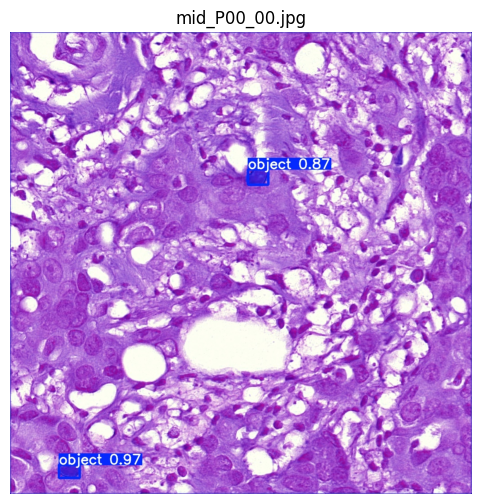

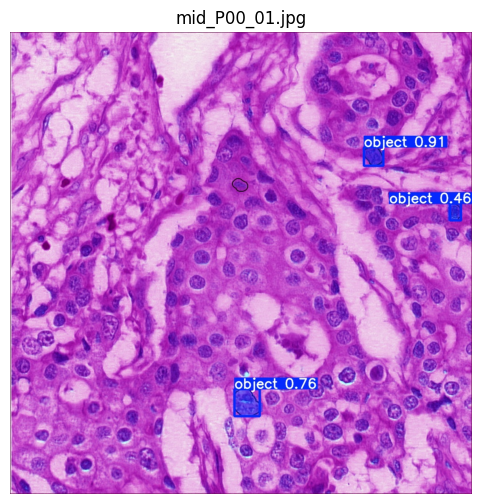

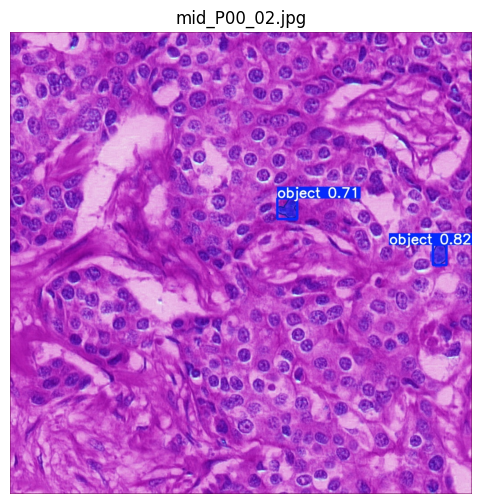

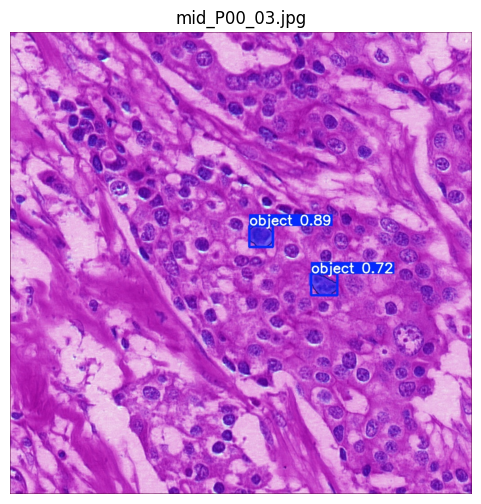

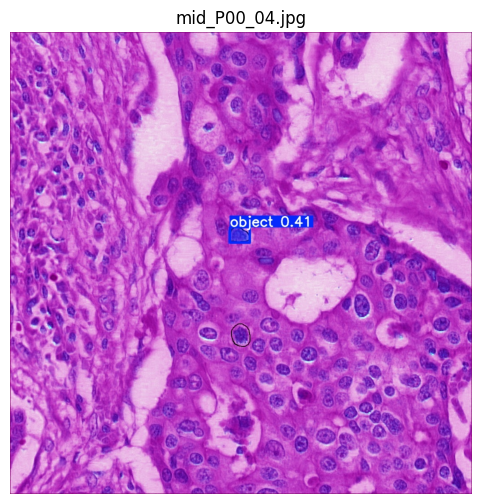

...

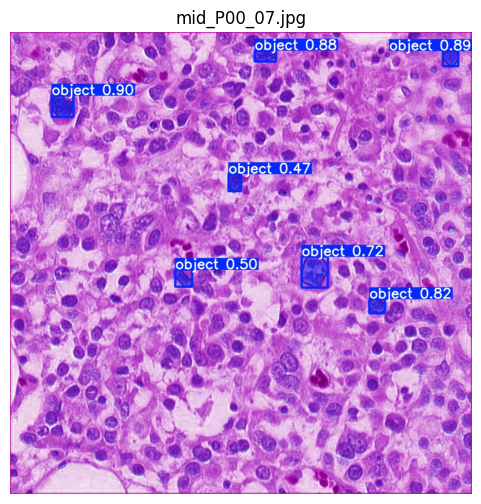

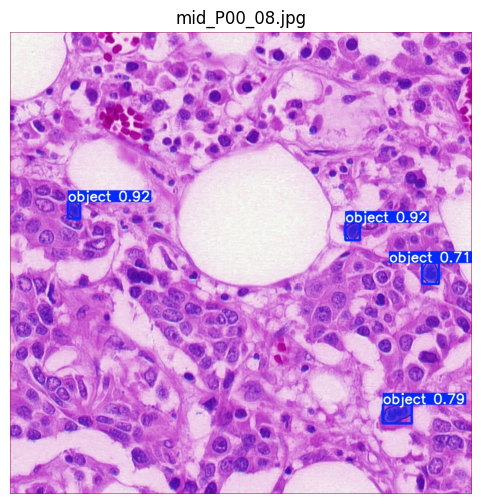

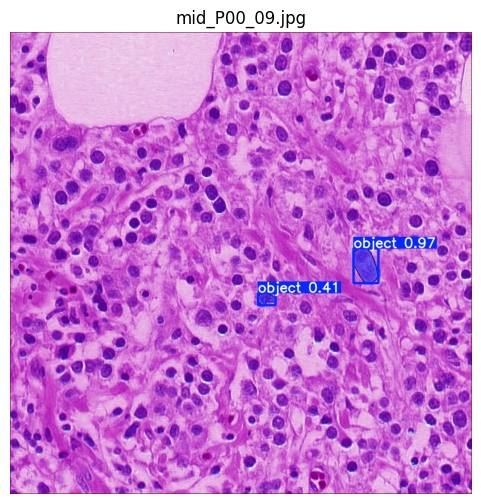

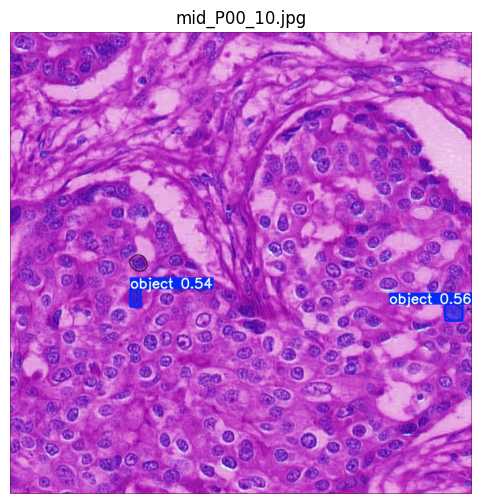

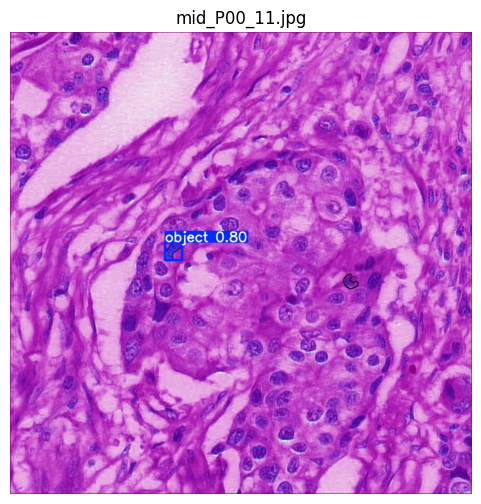

In [ ]:
import matplotlib.pyplot as plt
import cv2

show_n = 12
imgs = outs[:show_n]

for p in imgs:
    img = cv2.imread(str(p))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.title(p.name)
    plt.axis("off")
    plt.show()


Bulunan eşleşme: 8


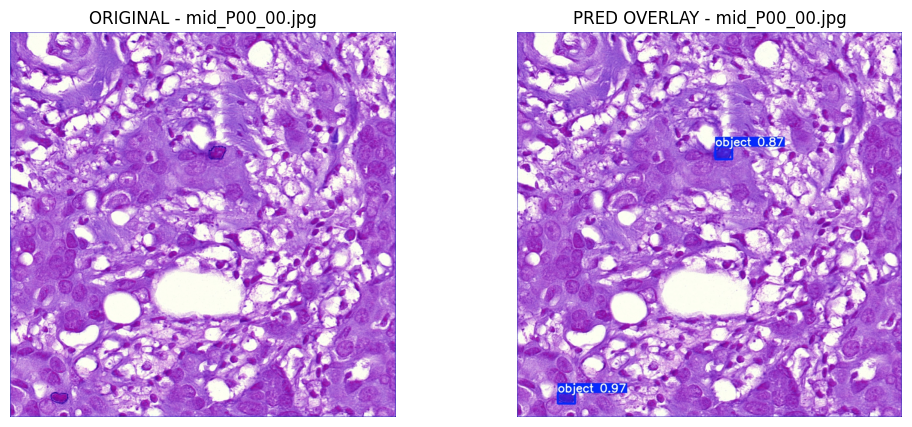

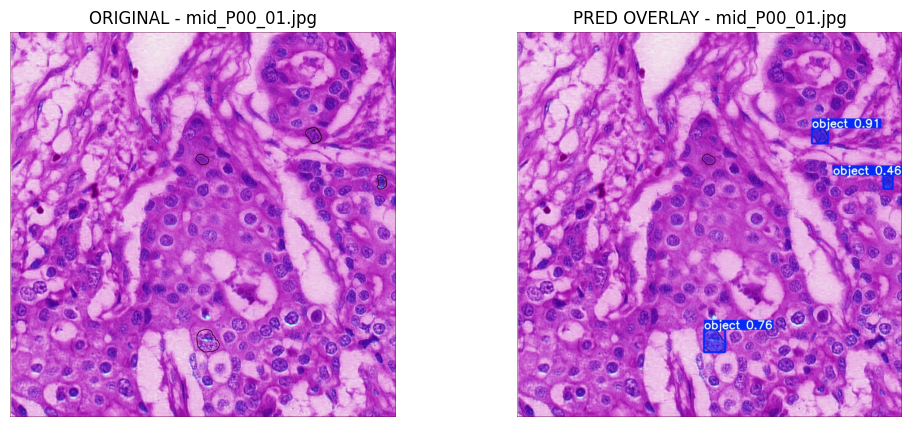

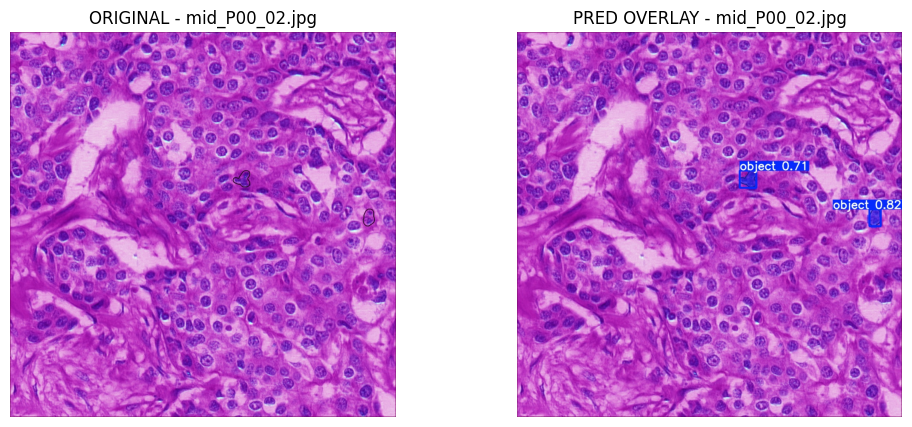

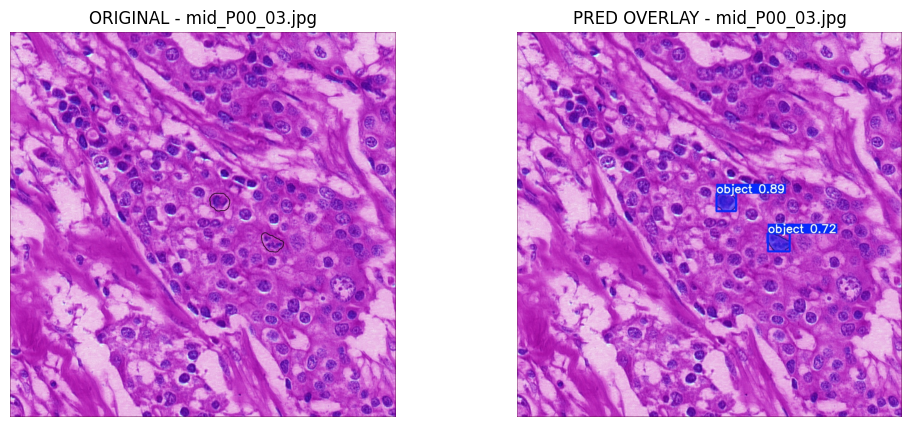

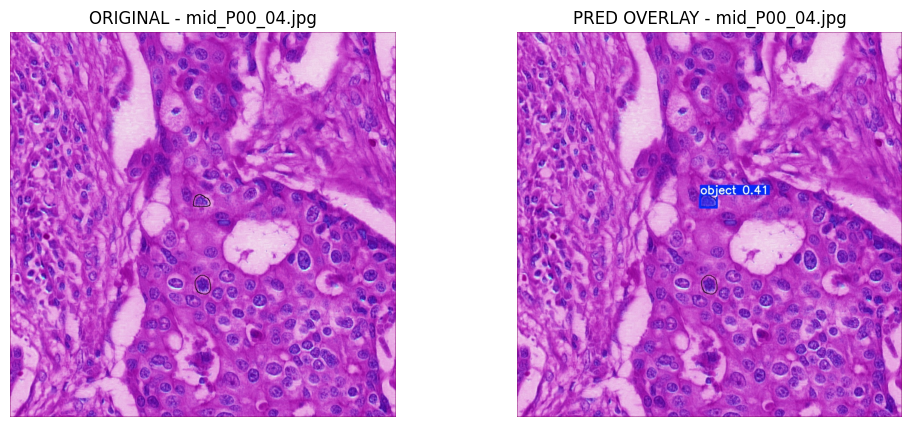

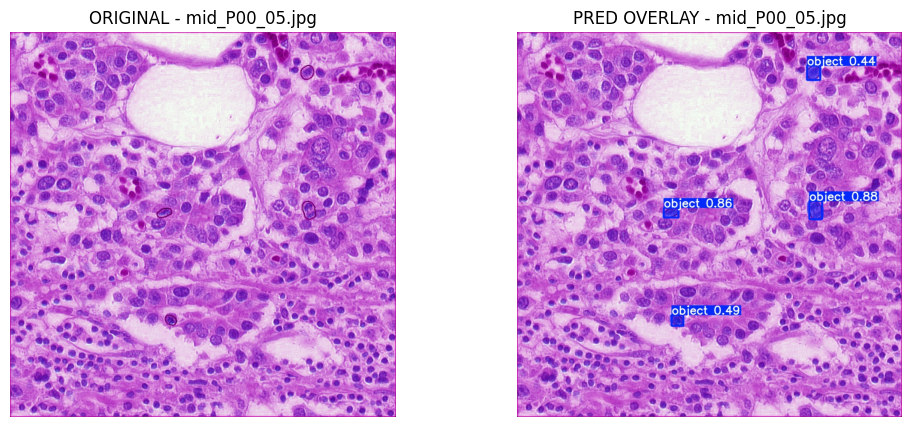

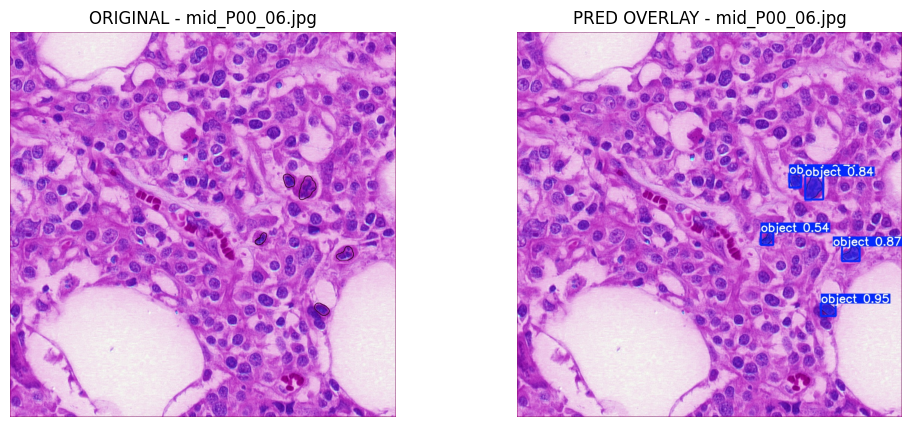

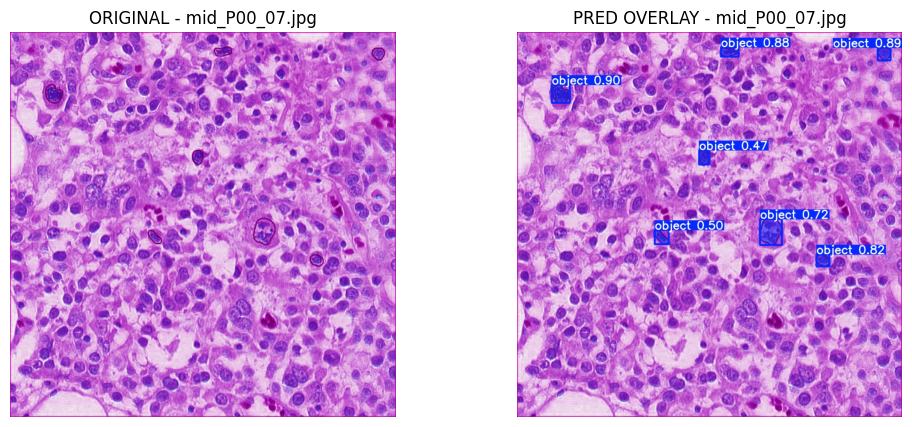

In [ ]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# aynı isimli dosyayı eşleştirmek için
pred_dir = last_predict
orig_dir = test_dir

# ilk 8 örnek
pairs = []
for pred_img in sorted(pred_dir.glob("*.jpg")):
    # pred dosya adı genelde aynı olur; değilse bu kısım yine de çalışır
    orig_img = orig_dir / pred_img.name
    if orig_img.exists():
        pairs.append((orig_img, pred_img))
    if len(pairs) >= 8:
        break

print("Bulunan eşleşme:", len(pairs))

for orig_path, pred_path in pairs:
    o = cv2.cvtColor(cv2.imread(str(orig_path)), cv2.COLOR_BGR2RGB)
    p = cv2.cvtColor(cv2.imread(str(pred_path)), cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1); plt.imshow(o); plt.title("ORIGINAL - " + orig_path.name); plt.axis("off")
    plt.subplot(1,2,2); plt.imshow(p); plt.title("PRED OVERLAY - " + pred_path.name); plt.axis("off")
    plt.show()


In [ ]:
import shutil
from pathlib import Path

dst = Path("/content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/predict_test_overlay")
if dst.exists():
    shutil.rmtree(dst)

shutil.copytree(last_predict, dst)
print("✅ Overlay çıktıları Drive'a kopyalandı:", dst)


✅ Overlay çıktıları Drive'a kopyalandı: /content/drive/MyDrive/Colab Notebooks/MERGED_YOLO/predict_test_overlay
